In [3]:
from qutip import *
from scipy import *
import numpy as np
def qubit_integrate(w, theta, gamma1, gamma2, psi0, tlist):
    # operators and the hamiltonian
    sx = sigmax(); sy = sigmay(); sz = sigmaz(); sm = sigmam()
    H = w * (cos(theta) * sz + sin(theta) * sx)
    # collapse operators
    c_op_list = []
    n_th = 0.5 # temperature
    rate = gamma1 * (n_th + 1)
    if rate > 0.0: c_op_list.append(sqrt(rate) * sm)
    rate = gamma1 * n_th
    if rate > 0.0: c_op_list.append(sqrt(rate) * sm.dag())
    rate = gamma2
    if rate > 0.0: c_op_list.append(sqrt(rate) * sz)


    # evolve and calculate expectation values
    output = mesolve(H, psi0, tlist, c_op_list, [sx, sy, sz])  
    return output.expect[0], output.expect[1], output.expect[2]
    
## calculate the dynamics
w     = 1.0 * 2 * pi   # qubit angular frequency
theta = 0.2 * pi       # qubit angle from sigma_z axis (toward sigma_x axis)
gamma1 = 0.5      # qubit relaxation rate
gamma2 = 0.2      # qubit dephasing rate
# initial state
a = 1.0
psi0 = (a* basis(2,0) + (1-a)*basis(2,1))/(sqrt(a**2 + (1-a)**2))
tlist = linspace(0,4,250)
#expectation values for ploting
sx, sy, sz = qubit_integrate(w, theta, gamma1, gamma2, psi0, tlist)

An example of generating images for an animation is given below where each loop, axis components are updated.

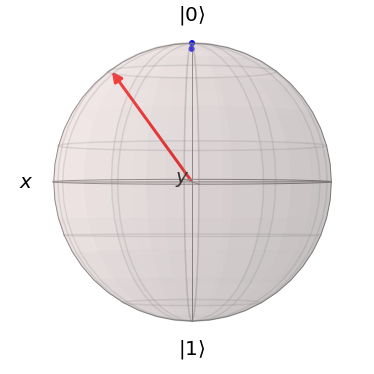

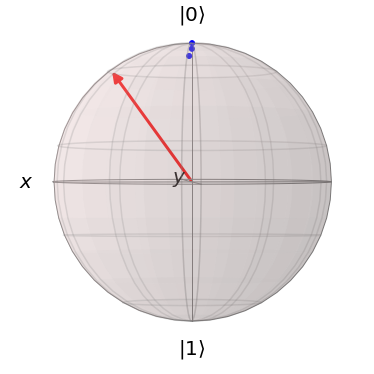

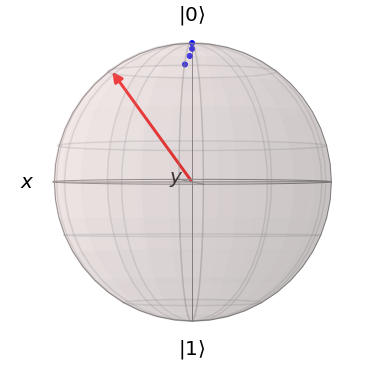

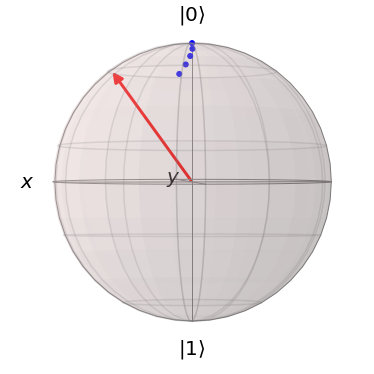

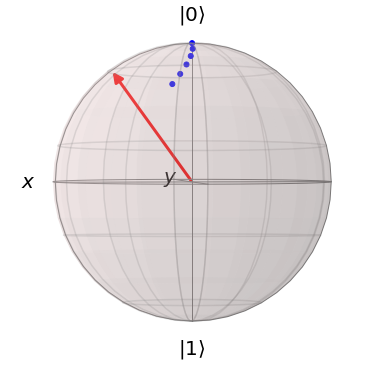

...

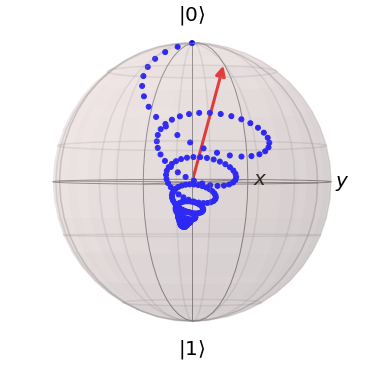

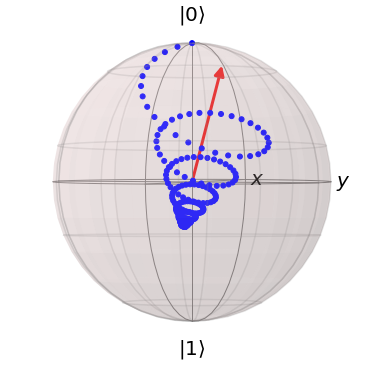

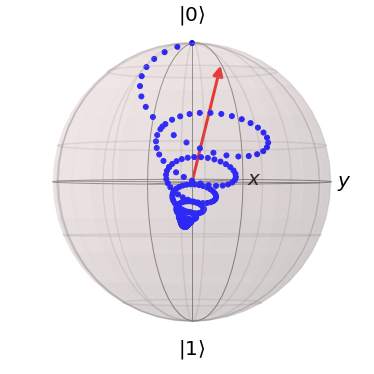

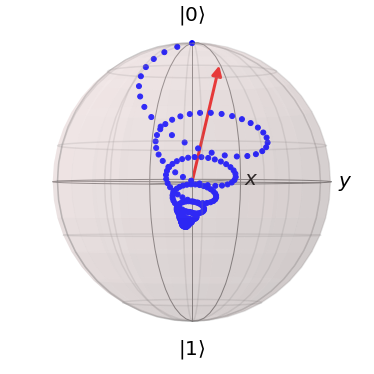

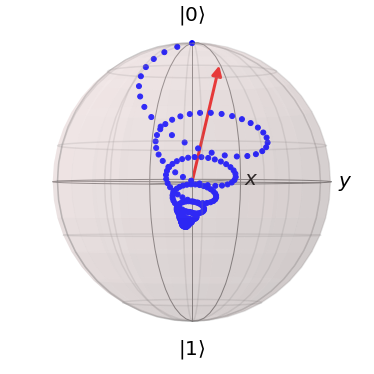

In [4]:
b = Bloch()
b.vector_color = ['r']
azim=1
elev=-1
b.view = [azim,elev]
for i in range(len(sx)):
    b.clear()
    b.add_vectors([np.sin(theta),0,np.cos(theta)])
    b.add_points([sx[:i+1],sy[:i+1],sz[:i+1]])
    b.update_view(azim, elev,'+', '-')
    b.show()